In [20]:
import pandas as pd 
import numpy as np 
import plotly.graph_objects as go

df_33 = pd.read_excel("/Users/sarthakmishra/Documents/Code/Lechler_3D_Nozzel/results/33.xlsx")
df_111 = pd.read_excel("/Users/sarthakmishra/Documents/Code/Lechler_3D_Nozzel/results/111.xlsx")
df_a = pd.read_excel("/Users/sarthakmishra/Documents/Code/Lechler_3D_Nozzel/results/a.xlsx")

In [21]:
# Displaying the plot
import plotly.graph_objects as go

# Create a trace for each distribution curve

trace_df_33 = go.Scatter(x=df_33['xpos'], y=df_33['level'], mode='lines', name='df_33')
trace_df_111 = go.Scatter(x=df_111['xpos'], y=df_111['level'], mode='lines', name='df_111')
trace_df_a = go.Scatter(x=df_a['xpos'], y=df_a['level'], mode='lines', name='df_a')

# Create the data list
data = [ trace_df_33, trace_df_111, trace_df_a]

# Create the layout
layout = go.Layout(
    title='Distribution Curves',
    xaxis=dict(title='xpos'),
    yaxis=dict(title='level'),
    showlegend=True
)

# Create the figure
fig = go.Figure(data=data, layout=layout)

# Display the figure
fig.show()



In [22]:
len(df_111['xpos'])
len(df_111['level'])

75

In [23]:
import plotly.graph_objects as go
num_of_distributions = 50 
distributions = []
for i in range(num_of_distributions):
    distributions.append(df_111)
    
len(distributions)

50

In [24]:
distributions[0]['xpos']

0        7.5
1       22.5
2       37.5
3       52.5
4       67.5
       ...  
70    1057.5
71    1072.5
72    1087.5
73    1102.5
74    1117.5
Name: xpos, Length: 75, dtype: float64

### CONTINUOUS APPROACH 

In [25]:

num_of_distributions = 20 # Number of distributions to plot

# Step 1: Duplicate df_111 50 times
df_duplicated = pd.concat([df_111]*num_of_distributions, ignore_index=True)

# Step 2: Add a y-axis value for each distribution
df_duplicated['y'] = np.repeat(np.arange(1, num_of_distributions+1), len(df_111))

# Step 3: Plot the data on a 3D graph using Plotly
fig = go.Figure(data=[go.Scatter3d(
    x=df_duplicated['xpos'],
    y=df_duplicated['y'],
    z=df_duplicated['level'],
    mode='markers',
    marker=dict(
        size=3,
        color=df_duplicated['level'],  # set color to an array/list of desired values
        colorscale='Viridis',   # choose a colorscale
        opacity=0.8
    )
)])

# Set layout properties
fig.update_layout(scene = dict(
                    xaxis_title='X',
                    yaxis_title='Y',
                    zaxis_title='Z'),
                    width=700,
                    margin=dict(r=20, b=10, l=10, t=10))

fig.show()

In [26]:
import plotly.graph_objects as go

# Create a heatmap
heatmap = go.Heatmap(
    x=df_duplicated['xpos'],
    y=df_duplicated['y'],
    z=df_duplicated['level'],
    colorscale='Viridis'
)

# Create a figure and add the heatmap
fig = go.Figure(data=[heatmap])

# Set layout properties
fig.update_layout(
    title='Heatmap of Z values',
    xaxis_title='X',
    yaxis_title='Y',
)

fig.show()

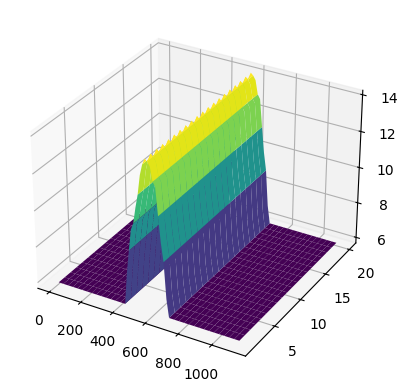

In [27]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

X = df_duplicated['xpos'].values
Y = df_duplicated['y'].values
Z = df_duplicated['level'].values.reshape(-1, len(np.unique(X)))

# Create a grid of X and Y values
X, Y = np.meshgrid(np.unique(X), np.unique(Y))

# Create a figure and a 3D subplot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
ax.plot_surface(X, Y, Z, cmap='viridis')

# Show the plot
plt.show()

In [28]:
import plotly.graph_objects as go

# Assume df_duplicated has columns 'xpos', 'y', and 'level'
X = df_duplicated['xpos'].values
Y = df_duplicated['y'].values
Z = df_duplicated['level'].values.reshape(-1, len(np.unique(X)))

# Create a grid of X and Y values
X, Y = np.meshgrid(np.unique(X), np.unique(Y))

# Create a 3D surface plot
fig = go.Figure(data=[go.Surface(z=Z, x=X, y=Y, colorscale='Viridis')])

# Show the plot
fig.show()

In [29]:
import plotly.graph_objects as go

# Assume df_duplicated has columns 'xpos', 'y', and 'level'
X = df_duplicated['xpos'].values
Y = df_duplicated['y'].values
Z = df_duplicated['level'].values.reshape(-1, len(np.unique(X)))

# Create a grid of X and Y values
X, Y = np.meshgrid(np.unique(X), np.unique(Y))

# Create a 3D surface plot for the Zmax plane
fig = go.Figure(data=[go.Surface(z=Z, x=X, y=Y, colorscale='Viridis', name='Zmax')])

# Assume df_user has the data for the user-specified z plane
# User-specified Z value
Z_value = 11  # replace with your actual value
Z_value_max = Z.max()

# Create a 2D array filled with the user-specified Z value
Z_plane = np.full((len(np.unique(Y)), len(np.unique(X))), Z_value)
Z_max_plane = np.full((len(np.unique(Y)), len(np.unique(X))), Z_value_max)

# Add the Z plane to the plot
#fig.add_trace(go.Surface(z=Z_plane, x=X, y=Y, showscale=False, opacity=0.5, name='Z plane', surfacecolor='blue'))
#fig.add_trace(go.Surface(z=Z_max_plane, x=X, y=Y, showscale=False, opacity=0.5, name='Z max plane',  surfacecolor='red'))

# Add the Z plane to the plot
fig.add_trace(go.Surface(z=Z_plane, x=X, y=Y, showscale=False, opacity=0.5, name='Z plane', surfacecolor=np.full(Z_plane.shape, 1), colorscale=[(0, 'blue'), (1, 'blue')]))
fig.add_trace(go.Surface(z=Z_max_plane, x=X, y=Y, showscale=False, opacity=0.5, name='Z max plane', surfacecolor=np.full(Z_max_plane.shape, 1), colorscale=[(0, 'red'), (1, 'red')]))

# Show the plot
fig.show()

In [30]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C

# Assume df_111 has columns 'xpos', 'y', and 'level'
X = df_duplicated[['xpos', 'y']].values
y = df_duplicated['level'].values

# Kernel for the Gaussian Process
kernel = C(1.0, (1e-3, 1e3)) * RBF(10, (1e-2, 1e2))

# Create a Gaussian process regressor model
model = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10, alpha=0.1)

# Fit the model
model.fit(X, y)

# Print the parameters of the fitted model
print('Kernel parameters:', model.kernel_)

Kernel parameters: 3.89**2 * RBF(length_scale=54.6)


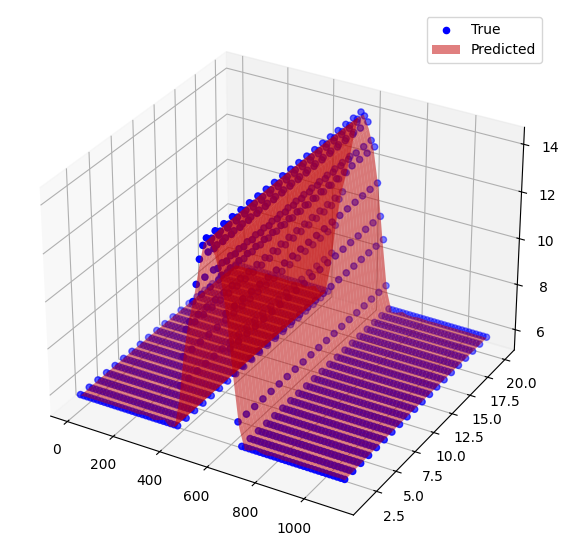

In [31]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Generate a grid of X and Y values
x = np.linspace(df_duplicated['xpos'].min(), df_duplicated['xpos'].max(), num=50)
y = np.linspace(df_duplicated['y'].min(), df_duplicated['y'].max(), num=50)
X, Y = np.meshgrid(x, y)

# Reshape the grid to pass it to the model
X_grid = np.vstack([X.ravel(), Y.ravel()]).T

# Predict the Z values
Z_pred = model.predict(X_grid)

# Reshape the predicted Z values to match the grid
Z_pred = Z_pred.reshape(X.shape)

# Create a figure and a 3D subplot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Plot the true surface
ax.scatter(df_duplicated['xpos'], df_duplicated['y'], df_duplicated['level'], color='b', label='True')

# Plot the predicted surface
ax.plot_surface(X, Y, Z_pred, color='r', alpha=0.5, label='Predicted')

# Show the plot
plt.legend()
plt.show()

In [32]:
from sympy import symbols, exp, sqrt
from sympy import latex
from IPython.display import display, Math

# Define the symbols
x1, y1, x2, y2, l, sigma = symbols('x1 y1 x2 y2 l sigma')

# Define the squared Euclidean distance
squared_distance = (x1 - x2)**2 + (y1 - y2)**2

# Define the RBF kernel function
rbf = exp(-0.5 * squared_distance / l**2)

# Define the constant kernel function
constant = sigma**2

# The kernel function used by the GaussianProcessRegressor model is a product of the constant and RBF kernels
kernel = constant * rbf

# Convert the kernel equation to a LaTeX string
kernel_latex = latex(kernel)

# Display the LaTeX string
display(Math(kernel_latex))

<IPython.core.display.Math object>

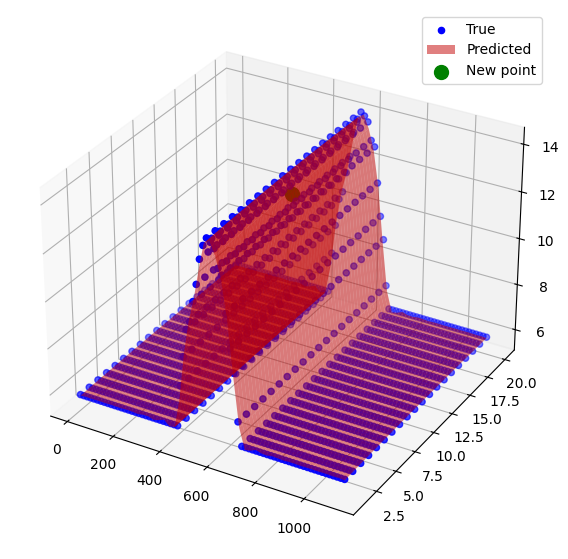

In [33]:
import matplotlib.pyplot as plt
import numpy as np

# Generate a grid of X and Y values
x = np.linspace(df_duplicated['xpos'].min(), df_duplicated['xpos'].max(), num=50)
y = np.linspace(df_duplicated['y'].min(), df_duplicated['y'].max(), num=50)
X, Y = np.meshgrid(x, y)

# Reshape the grid to pass it to the model
X_grid = np.vstack([X.ravel(), Y.ravel()]).T

# Predict the Z values
Z_pred = model.predict(X_grid)

# Reshape the predicted Z values to match the grid
Z_pred = Z_pred.reshape(X.shape)

# Create a figure and a 3D subplot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Plot the true surface
ax.scatter(df_duplicated['xpos'], df_duplicated['y'], df_duplicated['level'], color='b', label='True')

# Plot the predicted surface
ax.plot_surface(X, Y, Z_pred, color='r', alpha=0.5, label='Predicted')


# POINT PREDICT 
x_new  = 600 
y_new = 10
# Predict a new point and plot it
new_point = np.array([[x_new, y_new]])
z_new = model.predict(new_point)
ax.scatter([x_new], [y_new], [z_new], color='g', s=100, label='New point')

# Show the plot
plt.legend()
plt.show()

In [34]:
import numpy as np
from scipy.interpolate import griddata

# Define the points where you want to interpolate
grid_x, grid_y = np.mgrid[np.min(X):np.max(X):500j, np.min(Y):np.max(Y):500j]

# Interpolate the data
Z_interp = griddata((X.ravel(), Y.ravel()), Z_pred.ravel(), (grid_x, grid_y), method='cubic')


# Create a DataFrame from the interpolated data
df_interp = pd.DataFrame({
    'x': grid_x.ravel(),
    'y': grid_y.ravel(),
    'z': Z_interp.ravel()
})

# Create a pivot table from the DataFrame
pivot_table = df_interp.pivot(index='y', columns='x', values='z')

# Create a heatmap from the pivot table
fig = go.Figure(data=go.Heatmap(
                   z=pivot_table.values,
                   x=pivot_table.columns,
                   y=pivot_table.index,
                   colorscale='Viridis'))

# Add the predicted point
z_new = griddata((X.ravel(), Y.ravel()), Z_pred.ravel(), (x_new, y_new), method='cubic')  # Interpolate the z-value for the new point
fig.add_trace(go.Scatter(x=[x_new], y=[y_new], mode='markers', marker=dict(color='red', size=10), 
                         text=[f'x: {x_new:2f}, y: {y_new:2f}, z: {z_new:2f}'], hoverinfo='text'))  # Display the z-value when hovering over the point

# Show the plot
fig.show()

In [35]:
import numpy as np
from scipy.interpolate import griddata

# Define the points where you want to interpolate
grid_x, grid_y = np.mgrid[np.min(X):np.max(X):500j, np.min(Y):np.max(Y):500j]

# Interpolate the data
Z_interp = griddata((X.ravel(), Y.ravel()), Z_pred.ravel(), (grid_x, grid_y), method='cubic')

z_threshold = 6

# Create a mask for the z values that are above the threshold
mask = Z_interp.ravel() > z_threshold

# Create a DataFrame from the interpolated data, applying the mask
df_interp = pd.DataFrame({
    'x': grid_x.ravel()[mask],
    'y': grid_y.ravel()[mask],
    'z': Z_interp.ravel()[mask]
})

# Create a pivot table from the DataFrame
pivot_table = df_interp.pivot(index='y', columns='x', values='z')

# Create a heatmap from the pivot table
fig = go.Figure(data=go.Heatmap(
                   z=pivot_table.values,
                   x=pivot_table.columns,
                   y=pivot_table.index,
                   colorscale='Viridis'))

# Add the predicted point
z_new = griddata((X.ravel(), Y.ravel()), Z_pred.ravel(), (x_new, y_new), method='cubic')  # Interpolate the z-value for the new point
fig.add_trace(go.Scatter(x=[x_new], y=[y_new], mode='markers', marker=dict(color='red', size=10), 
                         text=[f'x: {x_new:2f}, y: {y_new:2f}, z: {z_new:2f}'], hoverinfo='text'))  # Display the z-value when hovering over the point

# Show the plot
fig.show()

In [36]:
import numpy as np
import plotly.graph_objects as go

# Define the parameters of the Gaussian distribution
mu = 0
sigma = 1

# Create a grid of x and y values
x = np.linspace(-3, 3, 100)
y = np.linspace(-3, 3, 100)
X, Y = np.meshgrid(x, y)

# Calculate the z values (heights) for each (x, y) pair
R = np.sqrt(X**2 + Y**2)
Z = np.exp(-(R - mu)**2 / (2 * sigma**2))

# Create a 3D surface plot
fig = go.Figure(data=[go.Surface(z=Z, x=X, y=Y, colorscale='Viridis')])

# Add a color bar
fig.update_layout(coloraxis_colorbar=dict(title="Z Value"))

# Show the plot
fig.show()


In [37]:
import numpy as np
import plotly.graph_objects as go

# Define the parameters of the Gaussian distribution
mu = 0
sigma = 1

# User-specified Z value
Z_value = 0.5  # replace with your actual value


# Create a grid of x and y values
x = np.linspace(-3, 3, 100)
y = np.linspace(-3, 3, 100)
X, Y = np.meshgrid(x, y)

# Calculate the z values (heights) for each (x, y) pair
R = np.sqrt(X**2 + Y**2)
Z = np.exp(-(R - mu)**2 / (2 * sigma**2))

# Find the maximum Z value and its corresponding X and Y values
Z_value_max = Z.max()
max_position = np.unravel_index(np.argmax(Z), Z.shape)
X_max = X[max_position]
Y_max = Y[max_position]

# Add some random noise to the Z values
noise = np.random.normal(0, 0.01, Z.shape)  # noise with mean 0 and standard deviation 0.1
Z += noise

# Create a 2D array filled with the user-specified Z value
Z_plane = np.full((len(np.unique(Y)), len(np.unique(X))), Z_value)
Z_max_plane = np.full((len(np.unique(Y)), len(np.unique(X))), Z_value_max)

# Create a 3D surface plot
fig = go.Figure(data=[go.Surface(z=Z, x=X, y=Y, colorscale='Viridis', showlegend=True)])


# Add the Z plane to the plot
fig.add_trace(go.Surface(z=Z_plane, x=X, y=Y, showscale=False, opacity=0.5, name='Z plane', surfacecolor=np.full(Z_plane.shape, 1), colorscale=[(0, 'blue'), (1, 'blue')] ,showlegend=True))
fig.add_trace(go.Surface(z=Z_max_plane, x=X, y=Y, showscale=False, opacity=0.5, name='Z max plane', surfacecolor=np.full(Z_max_plane.shape, 1), colorscale=[(0, 'red'), (1, 'red')], showlegend=True))

# Add a wireframe of lines joining the Zmax and user-defined Z plane
# Add lines from the maximum point on the surface to the user-defined plane
x_lines = []
y_lines = []
z_lines = []

tolerance = 0.01

for i in range(X.shape[0]):
    for j in range(X.shape[1]):
        if np.abs(Z[i, j]-Z_value) <= tolerance:
            x_lines.extend([X_max, X[i, j], None])
            y_lines.extend([Y_max, Y[i, j], None])
            z_lines.extend([Z_value_max, Z_value, None])

fig.add_trace(go.Scatter3d(x=x_lines, y=y_lines, z=z_lines, mode='lines', line=dict(color='black'),name='Lines', showlegend=True))

# Add a color bar
fig.update_layout(coloraxis_colorbar=dict(title="Z Value"))

# Update the layout to move the legend to the left of the screen
fig.update_layout(
    legend=dict(
        x=-0.1,  # this moves the legend to the left
        y=0.5,  # this centers the legend vertically
        orientation="v",  # this makes the legend vertical
        bgcolor='rgba(255, 255, 255, 0.5)',  # this sets the background color of the legend to semi-transparent white
        bordercolor='Black',
        borderwidth=2
    )
)



# Show the plot
fig.show()

In [93]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from scipy.interpolate import griddata

def create_heatmap(df, resolution, filter_value = None):
    
    """
    Creates a heatmap from a DataFrame.

    This function takes the X and Y plane and squishes down the 'level' values onto a 2D plane to create a heatmap.

    Parameters:
    df (pandas.DataFrame): The DataFrame containing the data. It should have columns 'xpos', 'y', and 'level'.
    resolution (int): The resolution of the heatmap. Higher values result in a smoother render, while lower values result in a more pixelated render.
    filter_value (float, optional): The filter value for the 'level' values. If provided, only the 'level' values above this value are displayed. Default is None.
    
    Returns:
    None. The function creates a plotly heatmap and displays it.

    Example:
    create_heatmap(df, resolution=100)
    
    """
    # Filter the DataFrame based on the filter_value
    if filter_value is not None:
        df = df[df['level'] > filter_value]
    
    # Create a grid with the desired resolution
    x = np.linspace(df['xpos'].min(), df['xpos'].max(), resolution)
    y = np.linspace(df['y'].min(), df['y'].max(), resolution)
    X, Y = np.meshgrid(x, y)

    # Interpolate the data to the new grid
    Z = griddata((df['xpos'], df['y']), df['level'], (X, Y), method='cubic')

    fig = go.Figure(data=go.Heatmap(
        z=Z,
        x=x,
        y=y,
        colorscale='Viridis'))
    fig.show()
    
    

def create_3d_distribution(df, Z_value=None, nozzle_position=None,filter_value=None):
    
    """
    Creates a 3D distribution plot from a DataFrame.

    Parameters:
    df (pandas.DataFrame): The DataFrame containing the data. It should have columns 'xpos', 'y', and 'level'.
    Z_value (float, optional): The value for the user defined Z plane. If provided, a plane at this Z value is added to the plot. Default is None.
    nozzle_position (float, optional): The position of the nozzle. If provided, a plane at this position is added to the plot. If not provided, the maximum 'level' value is used as the default.
    filter_value (float, optional): The filter value for the Z values. If provided, only the Z values above this value are displayed. Default is None.

    
    Returns:
    None. The function creates a plotly 3D plot and displays it.

    Example:
    create_3d_distribution(df, Z_value=10, nozzle_position=20)
    """
    
    # Filter the DataFrame based on the filter_value
    if filter_value is not None:
        df = df[df['level'] > filter_value]
    
    # Pivot the DataFrame to create a 2D array for 'Z'
    df_pivot = df.pivot(index='y', columns='xpos', values='level')

    fig = go.Figure(data=[go.Surface(z=df_pivot.values, x=df_pivot.columns, y=df_pivot.index, colorscale='Viridis', showlegend=True)])
    
    # Add user defined Z plane
    if Z_value is not None:
        Z_plane = np.full((len(np.unique(df['y'])), len(np.unique(df['xpos']))), Z_value)
        fig.add_trace(go.Surface(z=Z_plane, x=df_pivot.columns, y=df_pivot.index, showscale=False, opacity=0.5, name='Z plane', surfacecolor=np.full(Z_plane.shape, 1), colorscale=[(0, 'blue'), (1, 'blue')] ,showlegend=True))

    # Add nozzle position plane
    if nozzle_position is None:
        nozzle_position = df['level'].max()
    nozzle_position_plane = np.full((len(np.unique(df['y'])), len(np.unique(df['xpos']))), nozzle_position)
    fig.add_trace(go.Surface(z=nozzle_position_plane, x=df_pivot.columns, y=df_pivot.index, showscale=False, opacity=0.5, name='Nozzle position', surfacecolor=np.full(nozzle_position_plane.shape, 1), colorscale=[(0, 'red'), (1, 'red')], showlegend=True))
    
    # Adjust the position of the legend
    fig.update_layout(
        legend=dict(
            x=0,  # x position of the legend
            y=1,  # y position of the legend
            traceorder="normal",
            font=dict(
                family="sans-serif",
                size=12,
                color="black"
            ),
            bgcolor="LightSteelBlue",
            bordercolor="Black",
            borderwidth=2
        )
    )
    
    fig.show()


def add_lines(fig, df, Z_value):
    x_lines = []
    y_lines = []
    z_lines = []
    tolerance = 0.01
    Z_value_max = df['Z'].max()
    max_position = df['Z'].idxmax()
    X_max = df.loc[max_position, 'X']
    Y_max = df.loc[max_position, 'Y']

    for i in range(len(df)):
        if np.abs(df.loc[i, 'Z']-Z_value) <= tolerance:
            x_lines.extend([X_max, df.loc[i, 'X'], None])
            y_lines.extend([Y_max, df.loc[i, 'Y'], None])
            z_lines.extend([Z_value_max, Z_value, None])

    fig.add_trace(go.Scatter3d(x=x_lines, y=y_lines, z=z_lines, mode='lines', line=dict(color='black'),name='Lines', showlegend=True))
    return fig

In [80]:
df = df_duplicated


create_heatmap(df, 300, filter_value=8)